# DA623 Tutorial
## Topic: Short-time Fourier transform and Spectrogram Analysis
### Name: Siddharth Bhatt
### Roll number: 200121049

A signal is divided into several different windows and Fourier transforms for these windows are computed. When frequency components vary over time in a signal, STFT provides the time-localized information of these variations. On the other hand, a Fourier transform just provides frequency information averaged over the entire time duration. 

There can be a continuous Short-time Fourier transform or a discrete Short-time Fourier transform. The continuous STFT is represented as follows - 

$
X(\tau, f) = \int_{-\infty}^{\infty} x(t) \cdot w^*(t - \tau) \cdot e^{-j2\pi f t} \, dt
$

where,

$X(\tau, f)$ is the short-time Fourier transform of the signal.

$x(t)$ is the signal being analyzed.

$w(t)$ is the window function.

$\tau$ is the time-shift parameter.

$f$ is the frequency parameter.

$w^*(t - \tau)$ denotes the complex conjugate of the window function time-shifted by $\tau$.

$e^{-j2\pi f t}$ represents the complex exponential at frequency $f$.

The discrete STFT elements and their inverse are computed as follows - 


$
\chi_{STFT} [m, n]= \sum\limits^{L-1}_{N=0} {x[k] \cdot g[k-m] \cdot e^{-\frac{j2 \pi kn}{L}}}
$

$
x[k] = \sum\limits_{m}\sum\limits_{n} {\chi_{STFT} [m, n] \cdot g[k-m] \cdot e^{\frac{j2 \pi kn}{L}}}
$

$x[k]$ is the signal and $g[k]$ is the L-point window function. 

Firstly, we compute the STFT for the basic signals - sine, square and sawtooth. The frequencies for each of them can be varied using the widget slider.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
from scipy import signal
from ipywidgets import interact, FloatSlider

def generate_signal(type, duration=5.0, fs=1000, freq=50):
    t = np.linspace(0, duration, int(fs*duration), endpoint=False)
    if type == 'sine':
        return np.sin(2 * np.pi * freq * t), t
    elif type == 'square':
        return signal.square(2 * np.pi * freq * t), t
    elif type == 'sawtooth':
        return signal.sawtooth(2 * np.pi * freq * t), t

def perform_stft(signal, fs):
    f, t, Zxx = stft(signal, fs=fs, nperseg=512)
    return f, t, np.abs(Zxx)

def plot_signal_and_spectrogram(signal, t, fs):
    plt.figure(figsize=(12, 6))
    
    plt.subplot(211)
    plt.plot(t, signal)
    plt.title('Time Domain Signal')
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')

    plt.subplot(212)
    f, t, Zxx = perform_stft(signal, fs)
    plt.pcolormesh(t, f, np.abs(Zxx), shading='gouraud')
    plt.title('STFT Magnitude')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [s]')
    plt.tight_layout()
    plt.show()

def interactive_signal_and_spectrogram(freq = '50', type = 'sine'):
    signal_type = type 
    fs = 1000 
    duration = 5.0 

    def update_plot(freq):
        signal, t = generate_signal(signal_type, duration, fs, freq)
        plot_signal_and_spectrogram(signal, t, fs)
    
    interact(update_plot, freq=FloatSlider(min=1, max=200, step=1, value=50))

interactive_signal_and_spectrogram(50, 'sine')
interactive_signal_and_spectrogram(50, 'square')
interactive_signal_and_spectrogram(50, 'sawtooth')

interactive(children=(FloatSlider(value=50.0, description='freq', max=200.0, min=1.0, step=1.0), Output()), _d…

interactive(children=(FloatSlider(value=50.0, description='freq', max=200.0, min=1.0, step=1.0), Output()), _d…

interactive(children=(FloatSlider(value=50.0, description='freq', max=200.0, min=1.0, step=1.0), Output()), _d…

Visualizing the STFT of any signal is done through its spectrogram which is the intensity plot(frequency) versus time. 

There is also a slight difference between the spectrograms of a DFT and a STFT. This difference occurs in its frequency tiling. Visualizing this tiling better helps understand the principle behind STFT as we see the division on the temporal axis clearly.   

![Alt text](tiling.png)


(a) is DFT and (b) is STFT

There is trade-off between frequency and time resolution in STFT though and this trade-off depends on the width of the window selected. A narrow-width window would give a better resolution in time, but a poor resolution in frequency domain and vice versa. 

For each of the sound samples analysed below, there is a widget on top to change the window length (please give it a few seconds to load after using the slider) and there is a widget at the bottom to play the sound that has been uploaded.

In [2]:
import librosa
import librosa.display
from ipywidgets import interact, IntSlider
from IPython.display import Audio, display

def perform_stft_librosa(audio_path, n_fft=2048, hop_length=512):
    y, sr = librosa.load(audio_path, sr=None)
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    plt.figure(figsize=(12, 6))
    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='linear')
    plt.colorbar(format='%+2.0f dB')
    plt.title('STFT Spectrogram')
    plt.show()

def compare_stft_windows(audio_path, n_fft, hop_length=512):
    y, sr = librosa.load(audio_path, sr=None)
    
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='linear')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'STFT Spectrogram (Window Size: {n_fft})')
    plt.show()

def interactive_stft(audio_path):
    max_window_size = 8192  # maximum window size you want to allow
    hop_length = 512  # constant hop length
    
    def update_spectrogram(n_fft):
        compare_stft_windows(audio_path, n_fft=n_fft, hop_length=hop_length)
    
    def play_audio():
        display(Audio(audio_path))
    
    interact(update_spectrogram, n_fft=IntSlider(min=128, max=max_window_size, step=128, value=2048))
    play_audio()

audio_path = 'sound samples/piano-sample.wav'
interactive_stft(audio_path)


interactive(children=(IntSlider(value=2048, description='n_fft', max=8192, min=128, step=128), Output()), _dom…

The trade-off is clearly visible on changing the n_fft(window) values from the slider. For a narrower window, we see that the divisions and resolution in time axis are fine, but the frequency resolution is quite bad. Frequency appears much finer for the broadest window, but distortions along the time scale are visible then. 

Some value around around 2000 seems the best to keep frequency and time resolutions both good.

For the sample above, I put together some 5 piano notes and joined them in .wav format. The notes are arranged in an increasing fashion.  

When we analyze the Fourier transform of these notes, we're essentially breaking down the complex waveform into its constituent frequencies. In the case of lower notes on the piano, their fundamental frequencies are lower, resulting in a wider spacing between harmonics. As a result, when I plotted the frequency vs. time graph, more distinct horizontal lines corresponding to the harmonics were visible.

On the other hand, for higher notes, the fundamental frequency is higher, and the spacing between harmonics is closer together. This closer spacing makes it more difficult to distinguish individual harmonics in the Fourier transform, leading to fewer distinct horizontal lines in the frequency vs. time graph.

In [3]:
audio_path = 'sound samples/file_example_WAV_1MG.wav'
interactive_stft(audio_path)

interactive(children=(IntSlider(value=2048, description='n_fft', max=8192, min=128, step=128), Output()), _dom…

In the case above, the trade-off at narrow window is even more visible. For a lower value, the time resolution is clearly fine. 

In [4]:
audio_path = 'sound samples/file_example_WAV_2MG.wav'
interactive_stft(audio_path)


interactive(children=(IntSlider(value=2048, description='n_fft', max=8192, min=128, step=128), Output()), _dom…

The two sound samples are essentially same, but the second one is a slightly extended clip. If we listen to the second clip closely we can hear slight distrubance appearing in the background towards the end. That noise is clearly captured around the :08 second mark. 

In [5]:
audio_path = 'sound samples/StarWars60.wav'
interactive_stft(audio_path)

interactive(children=(IntSlider(value=2048, description='n_fft', max=8192, min=128, step=128), Output()), _dom…

In [6]:
audio_path = 'sound samples/PinkPanther30.wav'
interactive_stft(audio_path)

interactive(children=(IntSlider(value=2048, description='n_fft', max=8192, min=128, step=128), Output()), _dom…

For this Pink Panther theme, initially, the very high chimes/bells are visible for the entire 30-second duration. Around the :05 second mark, the low bass-like instrument can be seen in the spectrogram. The low-frequency notes can be seen after that mark. Towards the end when the flute-like instrument comes in with the lead part, their distinct notes are obvious as well. Around the 0:26 second mark, the flute plays a vibrato like note, which is captured in the spectrogram as well. Setting a window length of about 2048 seems to give the best view of all these intricacies in playing. 

Next I've tried using the three types of low-pass filters to filter out the higher frequencies. The modified sounds from each of them are saved. 

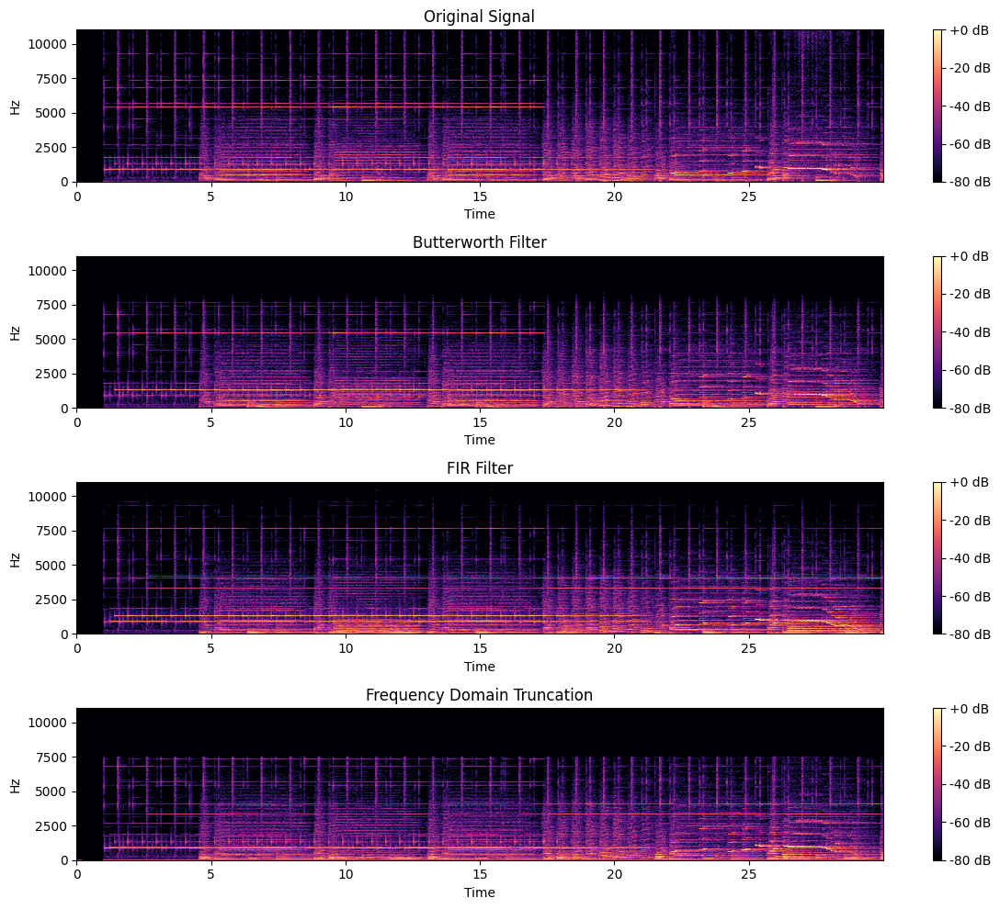

In [7]:
from scipy.io import wavfile

def perform_stft_librosa(audio_path):
    sr, y = wavfile.read(audio_path)

    y = y.astype(np.float32) / np.max(np.abs(y))

    cutoff_freq = 7500 
    nyquist_freq = sr / 2
    order = 5  #Filter order

    #Butterworth filter
    b, a = signal.butter(order, cutoff_freq / nyquist_freq, btype='low')
    y_filtered_butter = signal.filtfilt(b, a, y)

    #FIR filter design
    taps_fir = signal.firwin(order * 2 + 1, cutoff_freq / nyquist_freq, window='hamming')
    y_filtered_fir = signal.convolve(y, taps_fir, mode='same')

    #Direct truncation in frequency domain (ideal low-pass filter)
    Y = np.fft.rfft(y)
    freqs = np.fft.rfftfreq(len(y), d=1/sr)
    Y[np.abs(freqs) > cutoff_freq] = 0
    y_filtered_freq_domain = np.fft.irfft(Y)

    D_original = librosa.stft(y, n_fft=2048, hop_length=512)
    D_butter = librosa.stft(y_filtered_butter, n_fft=2048, hop_length=512)
    D_fir = librosa.stft(y_filtered_fir, n_fft=2048, hop_length=512)
    D_freq_domain = librosa.stft(y_filtered_freq_domain, n_fft=2048, hop_length=512)

    plt.figure(figsize=(12, 10))
    plt.subplot(4, 1, 1)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_original), ref=np.max), sr=sr, hop_length=512, x_axis='time', y_axis='linear')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Original Signal')

    plt.subplot(4, 1, 2)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_butter), ref=np.max), sr=sr, hop_length=512, x_axis='time', y_axis='linear')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Butterworth Filter')

    plt.subplot(4, 1, 3)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_fir), ref=np.max), sr=sr, hop_length=512, x_axis='time', y_axis='linear')
    plt.colorbar(format='%+2.0f dB')
    plt.title('FIR Filter')

    plt.subplot(4, 1, 4)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_freq_domain), ref=np.max), sr=sr, hop_length=512, x_axis='time', y_axis='linear')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Frequency Domain Truncation')

    plt.tight_layout()
    plt.show()

    wavfile.write('filtered_audio_butter.wav', sr, (y_filtered_butter * 32767).astype(np.int16))
    wavfile.write('filtered_audio_fir.wav', sr, (y_filtered_fir * 32767).astype(np.int16))
    wavfile.write('filtered_audio_freq_domain.wav', sr, (y_filtered_freq_domain * 32767).astype(np.int16))

audio_path = 'sound samples/PinkPanther30.wav'
perform_stft_librosa(audio_path)


I could hear the higher frequencies being tuned out. But at the same time there is a lot of distortion in noise. This could be one of the reasons why distortion occurs in audio communication where slight frequencies being cut-off lead to disturbances. The lower notes sound much better with the low pass filter applied though.

I decided to have fun with a pre-trained model called the Audio Spectrogram Transformer(https://huggingface.co/docs/transformers/en/model_doc/audio-spectrogram-transformer). I fed some of my samples and asked the model to categorise them based on their spectrograms. I would have loved to do more with this, but it took longer than I could afford now. 

Also, please note that this model works on audio samples with a sampling rate of 16 kHz. I had to down-sample the audio files being used in Audacity to accomodate that.

In [8]:
from transformers import ASTFeatureExtractor

feature_extractor = ASTFeatureExtractor()

In [9]:
import torchaudio

waveform, sampling_rate = torchaudio.load('sound samples/sample1.wav')
waveform = waveform.squeeze().numpy()

waveform = waveform.reshape(-1)
waveform.shape


(1428180,)

In [10]:
inputs = feature_extractor(waveform, sampling_rate=sampling_rate, padding="max_length", return_tensors="pt")
input_values = inputs.input_values
print(input_values.shape)     

torch.Size([1, 1024, 128])


In [11]:
from transformers import AutoModelForAudioClassification

model = AutoModelForAudioClassification.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593")

In [12]:
import torch

with torch.no_grad():
  outputs = model(input_values)

In [13]:
predicted_class_idx = outputs.logits.argmax(-1).item()
print("Predicted class:", model.config.id2label[predicted_class_idx])

Predicted class: Bird vocalization, bird call, bird song
